In [1]:
import os
from IPython.display import Image
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import random


In [2]:
# # one time: rename all files
# i = 0
# for fname in os.listdir('pictures'):
#     os.rename(f"pictures/{fname}", f"pictures/{i}.jpg")
#     i += 1

In [3]:
pictures_list = sorted(os.listdir('pictures'))
print(f"Total pictures in directory: {len(os.listdir('pictures'))}")


Total pictures in directory: 212


Random 5 pics:


155.jpg:


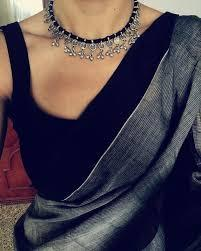

156.jpg:


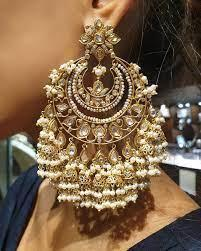

196.jpg:


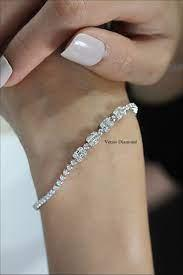

101.jpg:


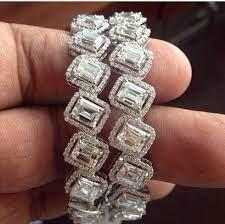

131.jpg:


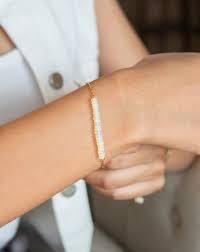

In [6]:
print("Random 5 pics:\n\n")

for i in range(5):
    fname = random.choice(os.listdir("pictures"))
    print(f"{fname}:")
    display(Image(filename=f"pictures/{fname}", width=200))


# Test 1:
Pick one image out of the dataset (`14.jpg`), modify it (`target.png`), and try to find the original image

Reference: https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html

TARGET:


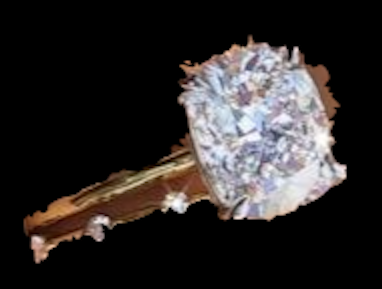

ORIGINAL:


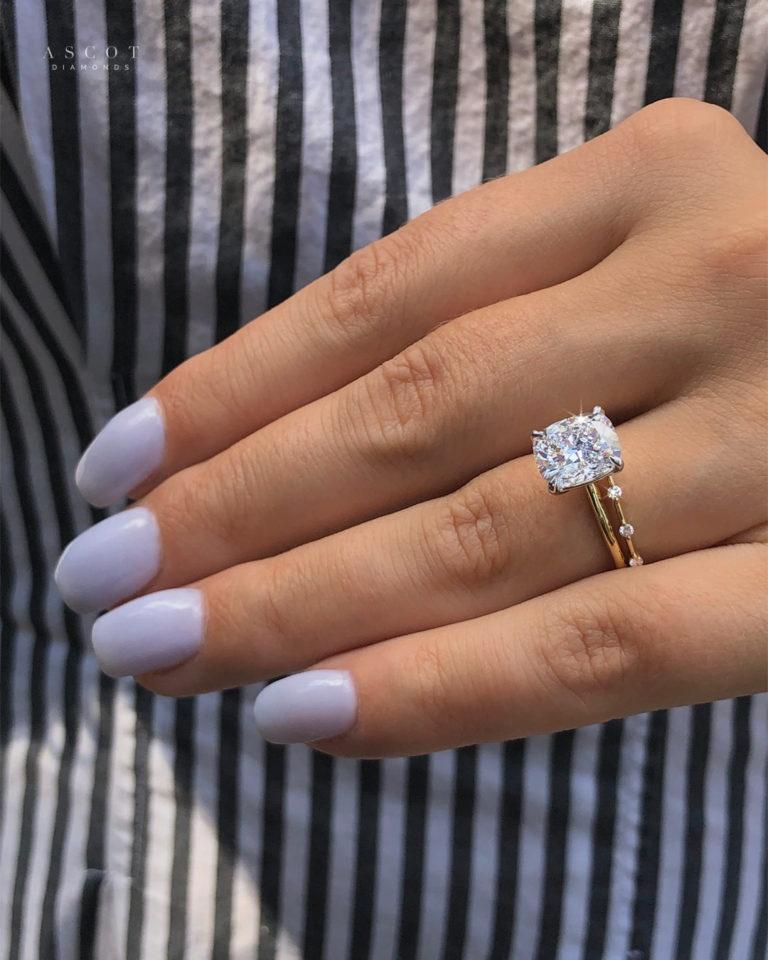

In [7]:
target = "target1.png"

# target is a cropped/rotated/stretched picture of 14.jpg
print("TARGET:")
display(Image(filename=target, width=300))
# target is a cropped/rotated/stretched picture of 14.jpg
print("ORIGINAL:")
display(Image(filename=f"pictures/14.jpg", width=300))

#1 image match: 14.jpg
match score: 178.0


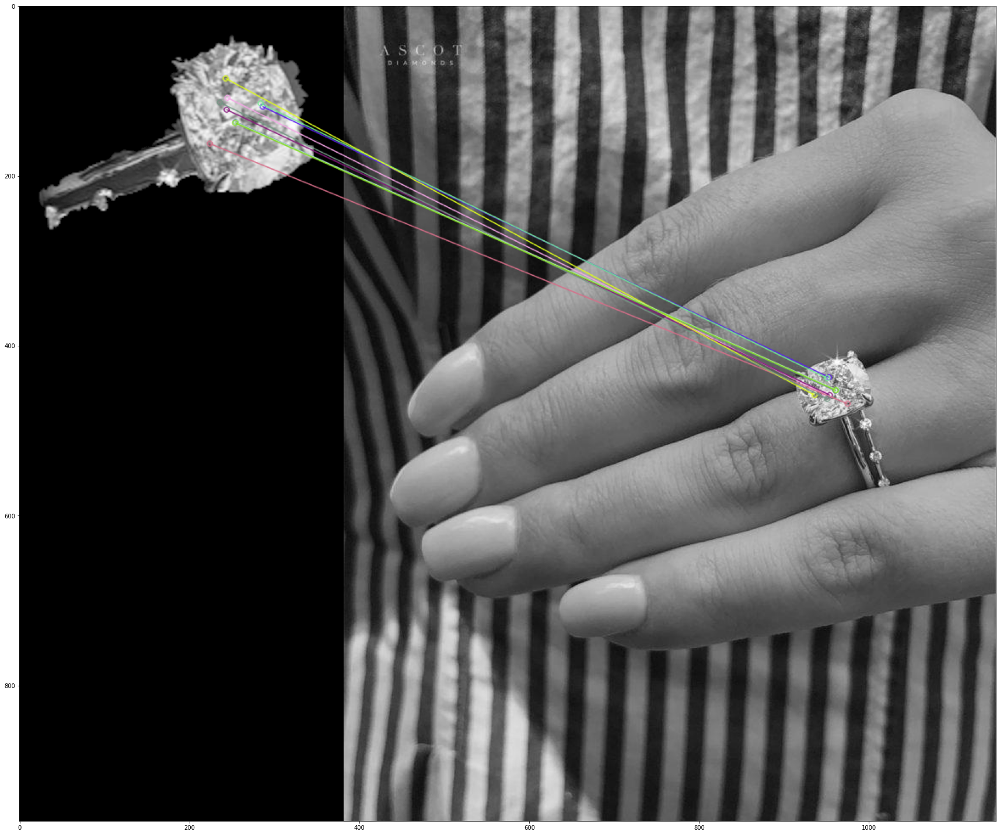

#2 image match: 183.jpg
match score: 387.0


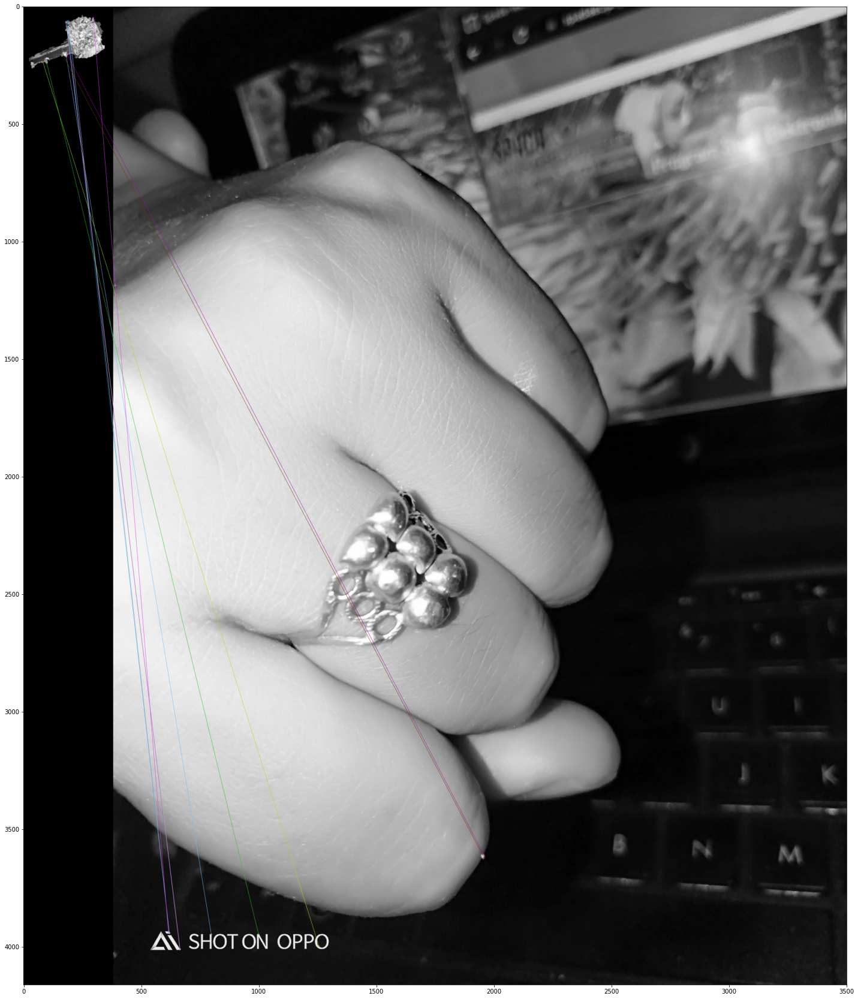

#3 image match: 144.jpg
match score: 407.0


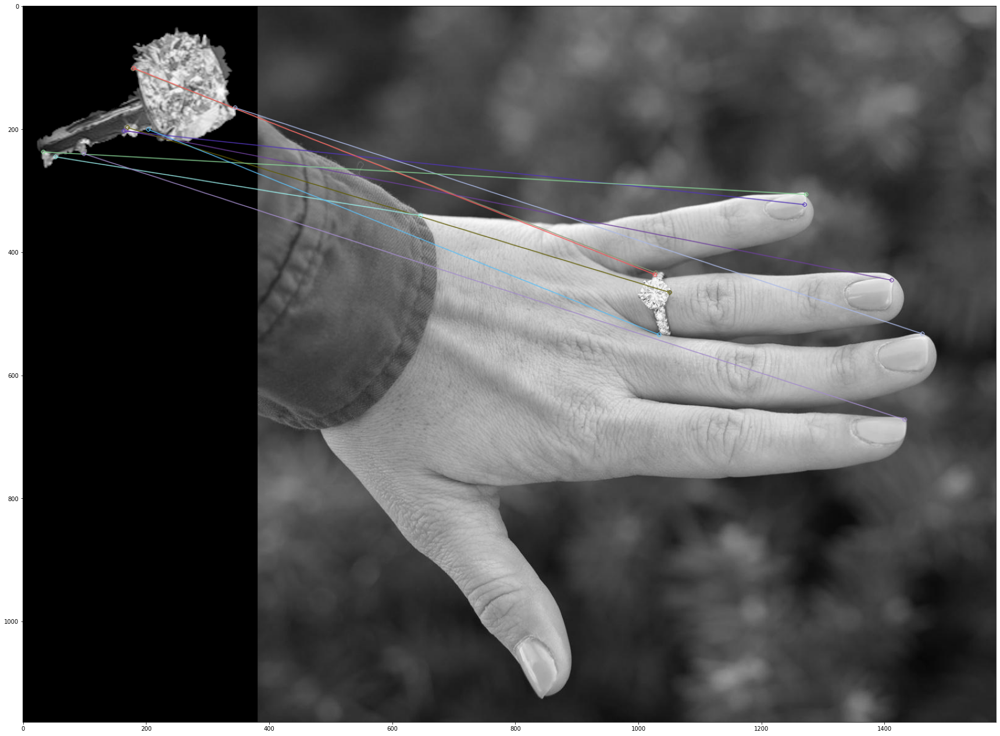

#4 image match: 60.jpg
match score: 408.0


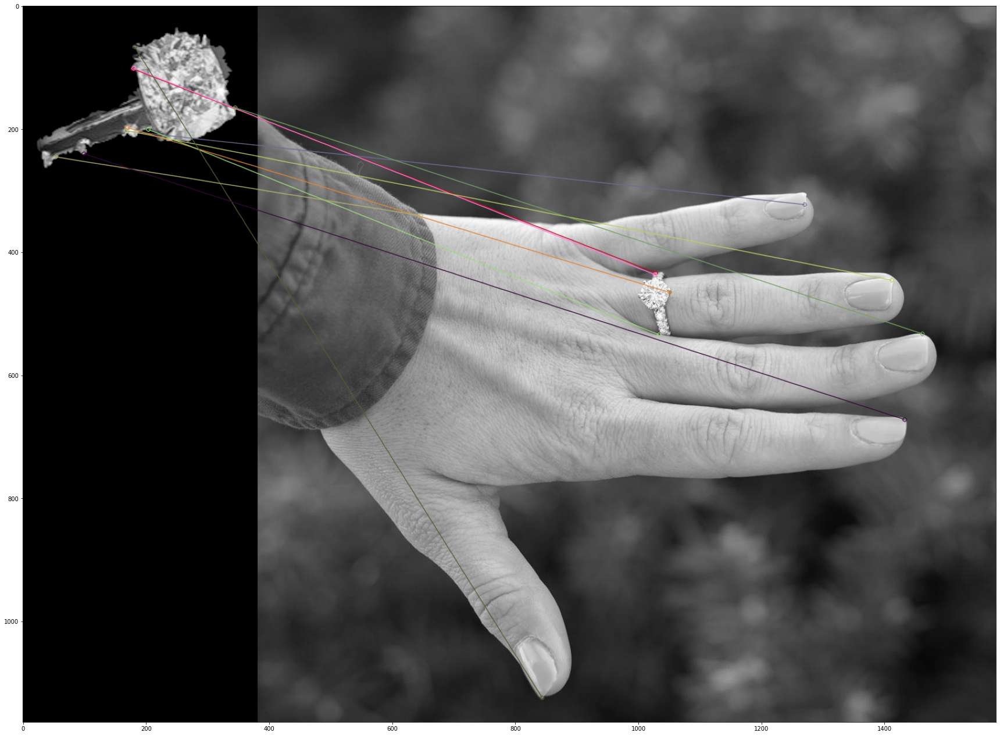

#5 image match: 116.jpg
match score: 415.0


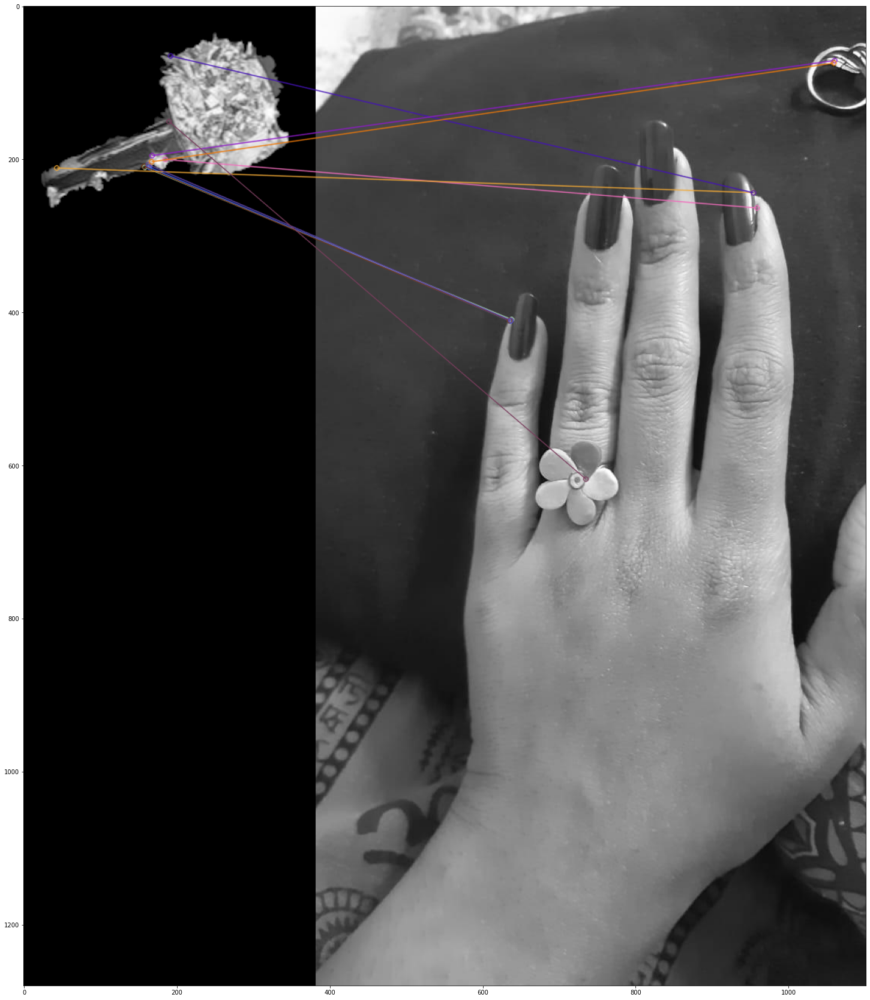

In [8]:
distances = []

for i in os.listdir("pictures"):
    img1 = cv.imread(target,cv.IMREAD_GRAYSCALE)          # queryImage
    img2 = cv.imread(f"pictures/{i}",cv.IMREAD_GRAYSCALE) # trainImage
    # Initiate ORB detector
    orb = cv.ORB_create()
    # find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    
    # create BFMatcher object
    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key=lambda x: x.distance)
    
    distances.append((i, sum([i.distance for i in matches[:10]]), matches[:10]))

distances.sort(key=lambda x: x[1])

for i in range(0, 5):
    match = distances[i]
    print(f"#{i+1} image match: {match[0]}\nmatch score: {match[1]}")
    
    # Draw first 10 matches
    img1 = cv.imread(target,cv.IMREAD_GRAYSCALE)          # queryImage
    img2 = cv.imread(f"pictures/{match[0]}",cv.IMREAD_GRAYSCALE) # trainImage
    # Initiate ORB detector
    orb = cv.ORB_create()
    # find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    img3 = cv.drawMatches(img1,kp1,img2,kp2,match[2],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(30,30)), plt.imshow(img3),plt.show()

# Test 2:

Pick a target that is similar but not from the same image

TARGET:


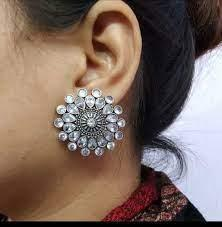

In [9]:
# 5, 23, 44
target = "target2.jpg"

# target is a cropped/rotated/stretched picture of 14.jpg
print("TARGET:")
display(Image(filename=target, width=300))


#1 image match: 5.jpg
match score: 0.0


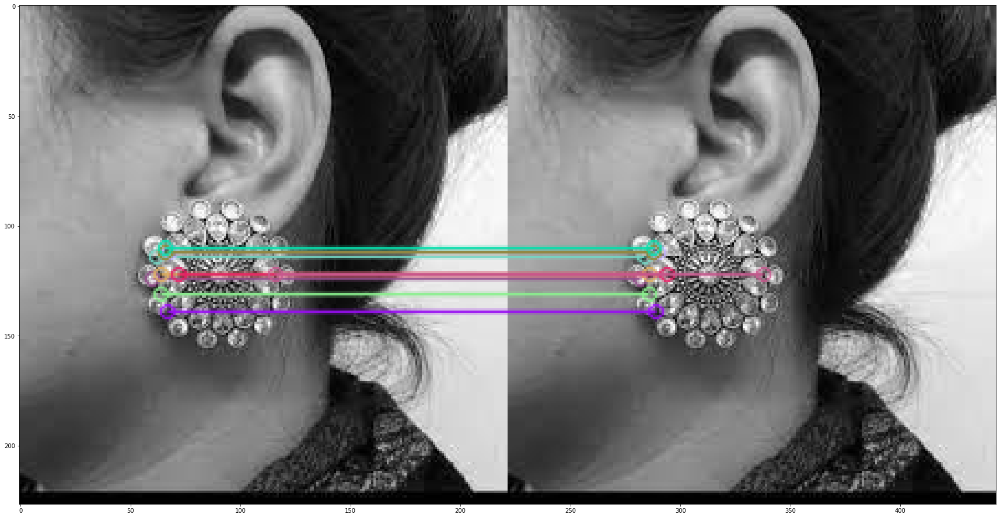

#2 image match: 44.jpg
match score: 439.0


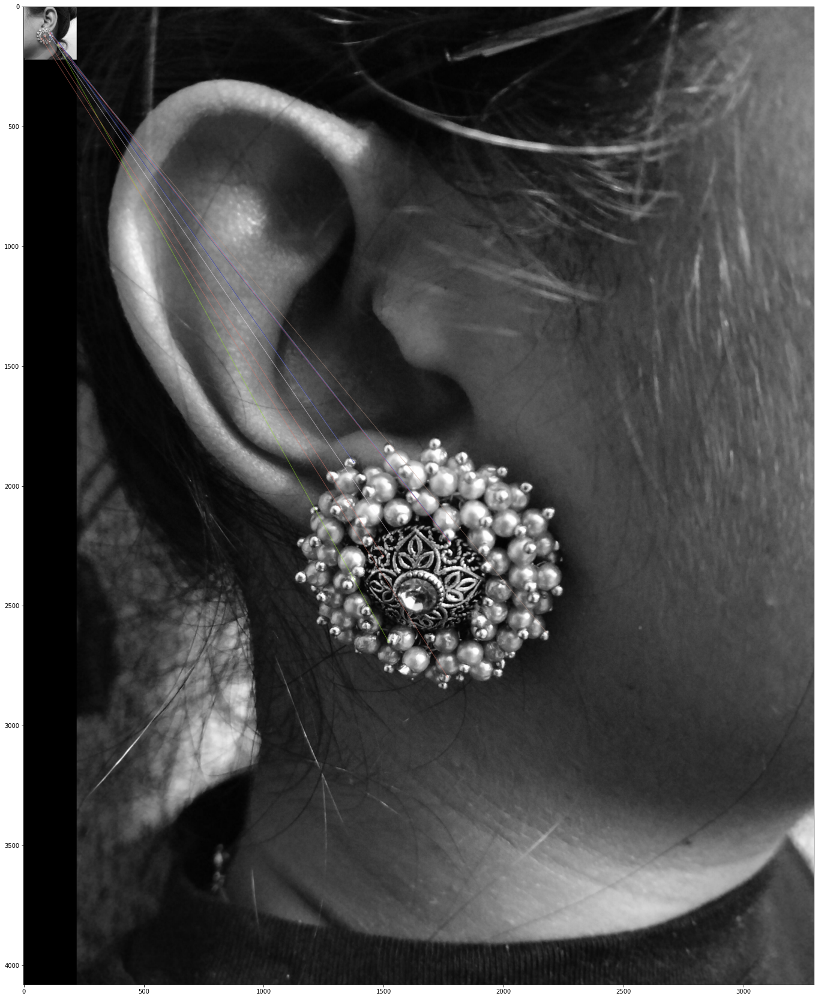

#3 image match: 0.jpg
match score: 444.0


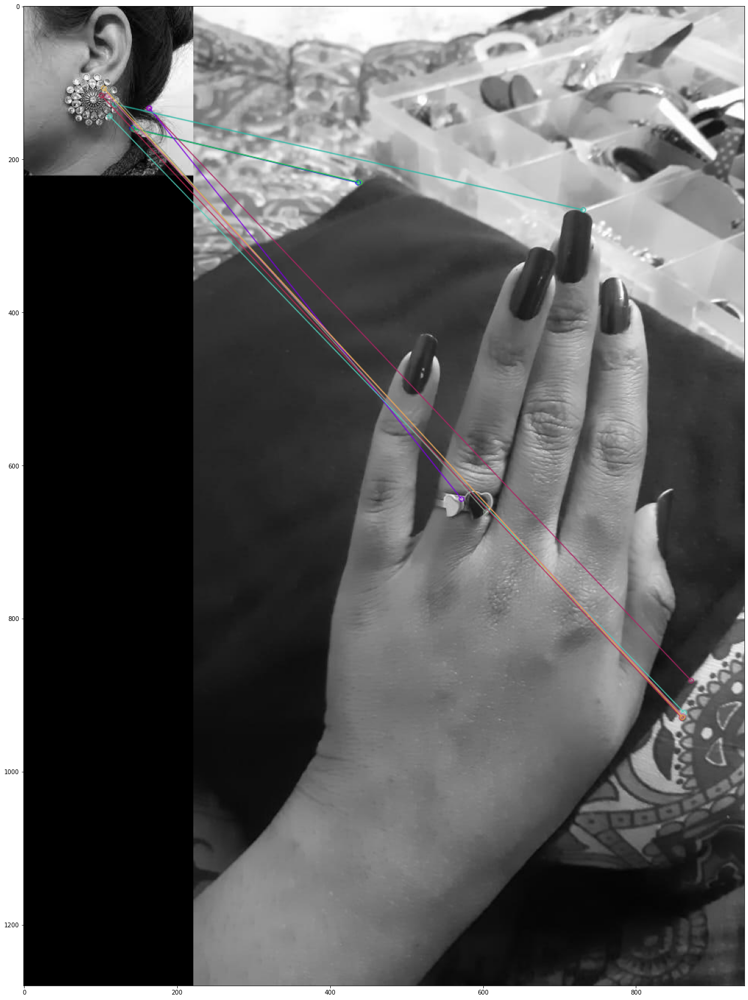

#4 image match: 193.jpg
match score: 448.0


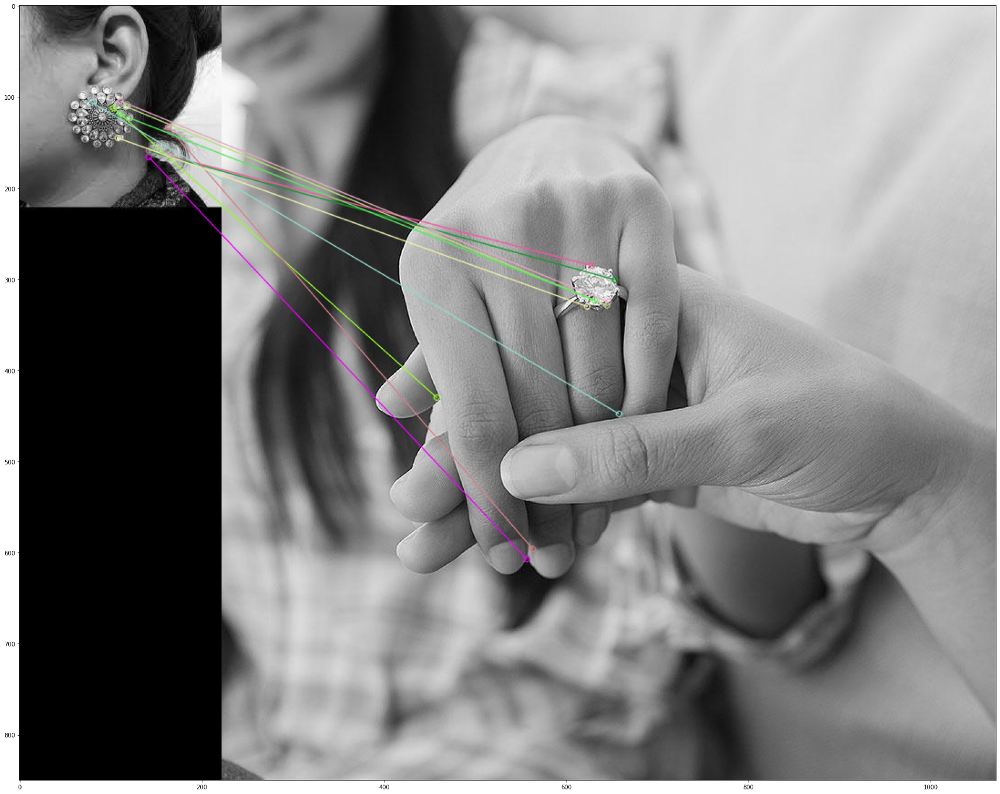

#5 image match: 28.jpg
match score: 449.0


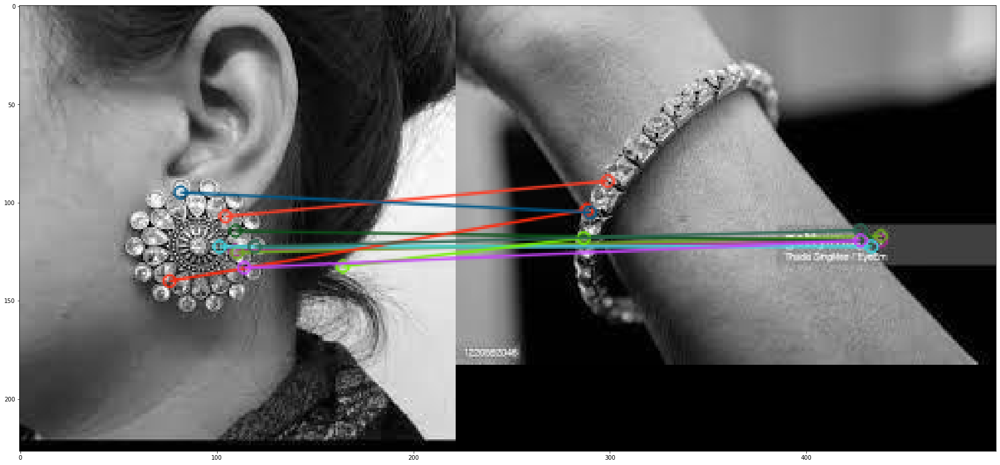

In [10]:
distances = []

for i in os.listdir("pictures"):
    img1 = cv.imread(target,cv.IMREAD_GRAYSCALE)          # queryImage
    img2 = cv.imread(f"pictures/{i}",cv.IMREAD_GRAYSCALE) # trainImage
    # Initiate ORB detector
    orb = cv.ORB_create()
    # find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    
    # create BFMatcher object
    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key=lambda x: x.distance)
    
    distances.append((i, sum([i.distance for i in matches[:10]]), matches[:10]))

distances.sort(key=lambda x: x[1])

for i in range(0, 5):
    match = distances[i]
    print(f"#{i+1} image match: {match[0]}\nmatch score: {match[1]}")
    
    # Draw first 10 matches
    img1 = cv.imread(target,cv.IMREAD_GRAYSCALE)          # queryImage
    img2 = cv.imread(f"pictures/{match[0]}",cv.IMREAD_GRAYSCALE) # trainImage
    # Initiate ORB detector
    orb = cv.ORB_create()
    # find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    img3 = cv.drawMatches(img1,kp1,img2,kp2,match[2],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(30,30)), plt.imshow(img3),plt.show()